In [1]:
using ITensors, ITensorMPS
using ITransverse
using ITensorExpMPO
using ITensors: Algorithm
using Plots
using Plots.PlotMeasures
using ProgressMeter
ProgressMeter.ijulia_behavior(:clear)

using Revise
includet("Alcaraz_2ndOrder_MPOgenerator.jl")

struct AlcarazModel <: ModelParams
    lambda::Float64
    p::Float64
    phys_site::Index
end

Hamiltonian given by:
$$H = -\sum_i \left( \sigma_i^z \sigma_{i+1}^z + \lambda \sigma_i^x \mathbf{+} p \sigma_i^z \sigma_{i+2}^z + p \lambda \sigma_i^x \sigma_{i+1}^x \right)$$

In [2]:
# System Parameters

# Alcaraz's NNN Self Dual Critical model
N = 50        
lambda = 1.0    # exact critical point (self dual)
p = 0.0         # NNN term (p>0 breakes system's integrability)
dt = 0.1       
T_max = 3     
cutoff = 1e-12
maxdim = 200

# Physical indices
sites = siteinds("S=1/2", N)

50-element Vector{Index{Int64}}:
 (dim=2|id=811|"S=1/2,Site,n=1")
 (dim=2|id=130|"S=1/2,Site,n=2")
 (dim=2|id=738|"S=1/2,Site,n=3")
 (dim=2|id=463|"S=1/2,Site,n=4")
 (dim=2|id=700|"S=1/2,Site,n=5")
 (dim=2|id=222|"S=1/2,Site,n=6")
 (dim=2|id=842|"S=1/2,Site,n=7")
 (dim=2|id=696|"S=1/2,Site,n=8")
 (dim=2|id=92|"S=1/2,Site,n=9")
 (dim=2|id=897|"S=1/2,Site,n=10")
 (dim=2|id=333|"S=1/2,Site,n=11")
 (dim=2|id=380|"S=1/2,Site,n=12")
 (dim=2|id=606|"S=1/2,Site,n=13")
 ⋮
 (dim=2|id=677|"S=1/2,Site,n=39")
 (dim=2|id=99|"S=1/2,Site,n=40")
 (dim=2|id=692|"S=1/2,Site,n=41")
 (dim=2|id=288|"S=1/2,Site,n=42")
 (dim=2|id=454|"S=1/2,Site,n=43")
 (dim=2|id=212|"S=1/2,Site,n=44")
 (dim=2|id=557|"S=1/2,Site,n=45")
 (dim=2|id=882|"S=1/2,Site,n=46")
 (dim=2|id=31|"S=1/2,Site,n=47")
 (dim=2|id=592|"S=1/2,Site,n=48")
 (dim=2|id=340|"S=1/2,Site,n=49")
 (dim=2|id=219|"S=1/2,Site,n=50")

### **HELPER FUNCTIONS**

In [18]:
# ALCARAZ MODEL

function compute_alcaraz_entropies(
    mpo_generator::Function, target_T::Float64;
    p::Float64=0.0, lambda::Float64=1.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    Ntime_steps = round(Int, target_T / dt)
    Nsteps = Ntime_steps + nbeta
    dbeta = -im * dt

    s = Index(2, "S=1/2")
    # init_state = up_state
    init_state = complex(state(s, "X+"))
    
    # Build tMPO blocks
    mp_alcaraz = AlcarazModel(lambda, p, s)
    tp = tMPOParams(dt, dbeta, mpo_generator, mp_alcaraz, nbeta, init_state)    
    b = FwtMPOBlocks(tp)
    
    # Power Method Params
    pm_params = PMParams(;
        truncp = (; cutoff=cutoff, maxdim=maxdim, alg=alg), 
        opt_method = :nosym, 
        cutoffs = [cutoff], 
        maxdims = 2:2:maxdim, 
        itermax = 5000, 
        eps_converged = eps_converged, 
        normalization = "overlap",
        stuck_after = 200,
        compute_fidelity = true
    )

    # Dynamically determine spatial bond dimension
    dummy_sites = siteinds("S=1/2", 4) 
    sample_mpo = mpo_generator(dummy_sites, lambda, p; dt=dt)
    spatial_bond_dim = dim(linkind(sample_mpo, 1))

    time_sites = addtags(siteinds(spatial_bond_dim, Nsteps), "time")
    mpo = fw_tMPO(b, time_sites; tr=tp.bl)
    start_mps = fw_tMPS(b, time_sites; tr=tp.bl, LR=:right)

    # Run Power Method
    psi_L, psi_R, _ = ITransverse.powermethod_lr(start_mps, mpo, mpo, pm_params)

    # Calculate entropy profiles (real & imaginary)
    p_r2_real = real.(ITransverse.gen_renyi2(psi_L, psi_R))
    p_r2_imag = imag.(ITransverse.gen_renyi2(psi_L, psi_R))

    bonds = 1:length(p_r2_real)

    return bonds, p_r2_real, p_r2_imag
end

function plot_entropy_evolution(
    mpo_generator::Function, 
    target_times::Vector{Float64};
    p::Float64=0.0, lambda::Float64=1.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    center_real = Float64[]
    center_imag = Float64[]
    actual_times = Float64[]

    # Top row: Profiles
    p_prof_real = plot(title="Re(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Re(S₂)", 
                       legend=:outertopright, grid=true)
    p_prof_imag = plot(title="Im(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Im(S₂)", 
                       legend=:outertopright, grid=true)
    
    # Bottom row: Center Bond Growth
    p_cent_real = plot(title="Re(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Re(S₂) Temp Ent.", 
                       legend=false, marker=:circle, lw=2, color=:blue, grid=true)
    p_cent_imag = plot(title="Im(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Im(S₂) Temp Ent.", 
                       legend=false, marker=:square, lw=2, color=:red, grid=true)

    n_times = length(target_times)
    colors_real = cgrad(:viridis, n_times, categorical=true)
    colors_imag = cgrad(:plasma, n_times, categorical=true)

    @showprogress for (i, T) in enumerate(target_times)
        bonds, r2_re, r2_im = compute_alcaraz_entropies(
            mpo_generator, T; 
            lambda=lambda, p=p, dt=dt, cutoff=cutoff, maxdim=maxdim, 
            alg=alg, eps_converged=eps_converged, nbeta=nbeta
        )

        # Normalize x axis
        n_bonds = length(r2_re)
        x_normalized = range(0.0, 1.0, length=n_bonds)
        
        center_idx = div(length(r2_re), 2) + 1
        push!(center_real, r2_re[center_idx])
        push!(center_imag, r2_im[center_idx])
        push!(actual_times, T)
        
        time_label = "t = $(round(T, digits=2))"
        
        plot!(p_prof_real, x_normalized, r2_re, label=time_label, lw=2, color=colors_real[i])
        plot!(p_prof_imag, x_normalized, r2_im, label=time_label, lw=2, color=colors_imag[i])
    end
    
    plot!(p_cent_real, actual_times, center_real)
    plot!(p_cent_imag, actual_times, center_imag)

    final_plot = plot(
        p_prof_real, p_prof_imag, p_cent_real, p_cent_imag, 
        layout=(2, 2), 
        size=(1200, 800),
        margin=5Plots.mm,
        plot_title="Alcaraz Model Temporal Entanglement (p=$p, lambda=$lambda)"
    )
    display(final_plot)
    
    return actual_times, center_real, center_imag
end

# ISING MODEL

function compute_ising_entropies(
    target_T::Float64;
    JXX::Float64=1.0, hz::Float64=1.0, gx::Float64=0.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    Ntime_steps = round(Int, target_T / dt)
    Nsteps = Ntime_steps + nbeta
    dbeta = -im * dt

    s = Index(2, "S=1/2")
    init_state = up_state
    
    # Build tMPO blocks
    mp_ising = IsingParams(JXX, hz, gx)
    tp = tMPOParams(dt, dbeta, expH_ising_murg, mp_ising, nbeta, init_state)    
    b = FwtMPOBlocks(tp)
    
    # Power Method Params
    pm_params = PMParams(;
        truncp = (; cutoff=cutoff, maxdim=maxdim, alg=alg), 
        opt_method = :nosym, 
        cutoffs = [cutoff], 
        maxdims = 2:2:maxdim, 
        itermax = 5000, 
        eps_converged = eps_converged, 
        normalization = "overlap",
        stuck_after = 200,
        compute_fidelity = true
    )

    time_sites = addtags(siteinds("S=1/2", Nsteps; conserve_qns=false), "time")
    mpo = fw_tMPO(b, time_sites; tr=tp.bl)
    start_mps = fw_tMPS(b, time_sites; tr=tp.bl, LR=:right)

    # Run Power Method
    psi_L, psi_R, _ = ITransverse.powermethod_lr(start_mps, mpo, mpo, pm_params)

    # Calculate entropy profiles (real & imaginary)
    p_r2_real = real.(ITransverse.gen_renyi2(psi_L, psi_R))
    p_r2_imag = imag.(ITransverse.gen_renyi2(psi_L, psi_R))

    bonds = 1:length(p_r2_real)

    return bonds, p_r2_real, p_r2_imag
end

function plot_ising_entropy_evolution(
    target_times::Vector{Float64};
    JXX::Float64=1.0, hz::Float64=1.0, gx::Float64=0.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    center_real = Float64[]
    center_imag = Float64[]
    actual_times = Float64[]

    # Top row: Profiles
    p_prof_real = plot(title="Re(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Re(S₂)", 
                       legend=:outertopright, grid=true)
    p_prof_imag = plot(title="Im(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Im(S₂)", 
                       legend=:outertopright, grid=true)
    
    # Bottom row: Center Bond Growth
    p_cent_real = plot(title="Re(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Re(S₂) Temp Ent.", 
                       legend=false, marker=:circle, lw=2, color=:blue, grid=true)
    p_cent_imag = plot(title="Im(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Im(S₂) Temp Ent.", 
                       legend=false, marker=:square, lw=2, color=:red, grid=true)

    n_times = length(target_times)
    colors_real = cgrad(:viridis, n_times, categorical=true)
    colors_imag = cgrad(:plasma, n_times, categorical=true)

    @showprogress for (i, T) in enumerate(target_times)
        bonds, r2_re, r2_im = compute_ising_entropies(
            T; 
            JXX=JXX, hz=hz, gx=gx, dt=dt, 
            cutoff=cutoff, maxdim=maxdim, 
            alg=alg, eps_converged=eps_converged, nbeta=nbeta
        )
        
        # Normalize x axis
        n_bonds = length(r2_re)
        x_normalized = range(0.0, 1.0, length=n_bonds)

        center_idx = div(length(r2_re), 2) + 1
        push!(center_real, r2_re[center_idx])
        push!(center_imag, r2_im[center_idx])
        push!(actual_times, T)
        
        time_label = "t = $(round(T, digits=2))"
        
        plot!(p_prof_real, x_normalized, r2_re, label=time_label, lw=2, color=colors_real[i])
        plot!(p_prof_imag, x_normalized, r2_im, label=time_label, lw=2, color=colors_imag[i])
    end
    
    plot!(p_cent_real, actual_times, center_real)
    plot!(p_cent_imag, actual_times, center_imag)

    final_plot = plot(
        p_prof_real, p_prof_imag, p_cent_real, p_cent_imag, 
        layout=(2, 2), 
        size=(1200, 800),
        margin=5Plots.mm,
        plot_title="Ising Model Temporal Entanglement (J=$JXX, hz=$hz, gx=$gx)"
    )
    display(final_plot)
    
    return actual_times, center_real, center_imag
end

plot_ising_entropy_evolution (generic function with 1 method)

[PM LR|naiveRTM|nosym] L=104, cutoff=1.0e-12, maxdim=150, normalize=overlap)   6%  ETA: 0:05:16 (67.18 ms/it)
   Info: [300]  chi=8 | ds=0.0005995636953892713 | <R|Rprev> = -7.603592140316738e-8┌ Warning: PM Stuck after 201/302 steps | ds=0.0005770685562624667 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:01:32


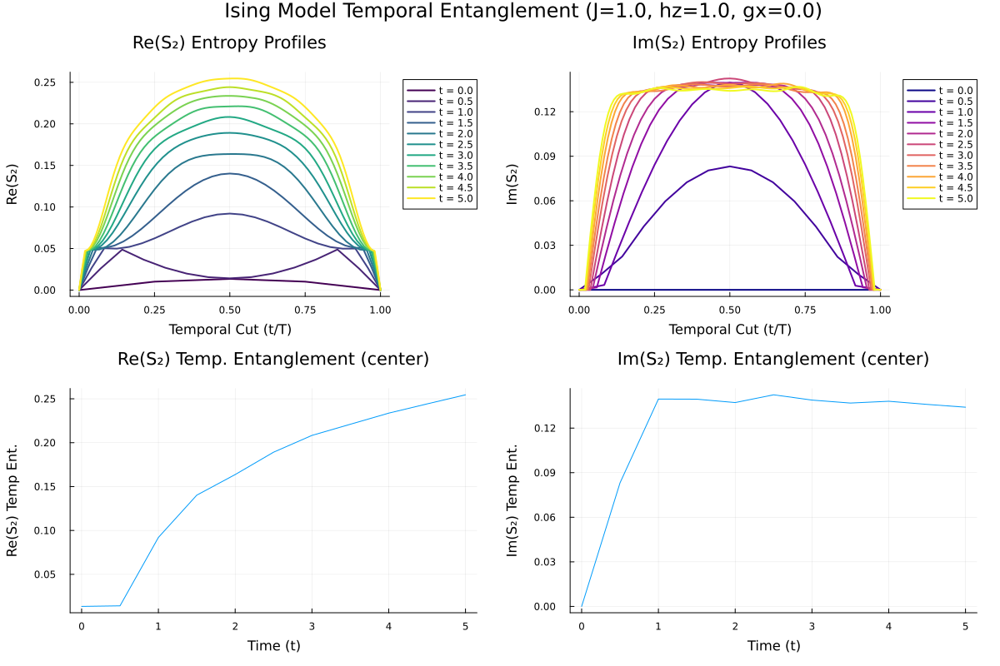

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.013442993109638255, 0.014102752099510455, 0.09204816428252244, 0.1402332904892373, 0.16369849897111236, 0.18918121426074172, 0.20831978579183508, 0.22102073722442547, 0.23369203372674807, 0.24421698162182212, 0.25456833749756763], [-0.0, 0.08315938762786883, 0.13953862971338396, 0.13945301855379724, 0.13717705927164592, 0.14239419977274617, 0.1388467266615361, 0.13684800445115622, 0.13805181611124479, 0.13594227807597523, 0.13405374619866378])

In [4]:
# Test times from t=0.2 to t=2.0
test_times = collect(0.0 : 0.5 : 5.0)

# Execute the simulation
times, c_real, c_imag = plot_ising_entropy_evolution(
    test_times;
    JXX = 1.0, 
    hz = 1.0,   # Transverse field (Set to 1.0 for the critical point if gx=0)
    gx = 0.0,   # Longitudinal field
    dt = 0.05,
    maxdim = 150
)

[PM LR|naiveRTM|nosym] L=254, cutoff=1.0e-12, maxdim=250, normalize=overlap)   7%  ETA: 0:23:52 ( 0.31  s/it)
   Info: [347]  chi=8 | ds=0.0065799217347191075 | <R|Rprev> = -0.0012726401948386157┌ Warning: PM Stuck after 201/348 steps | ds=0.008158261376663423 | chi=7)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:06:14


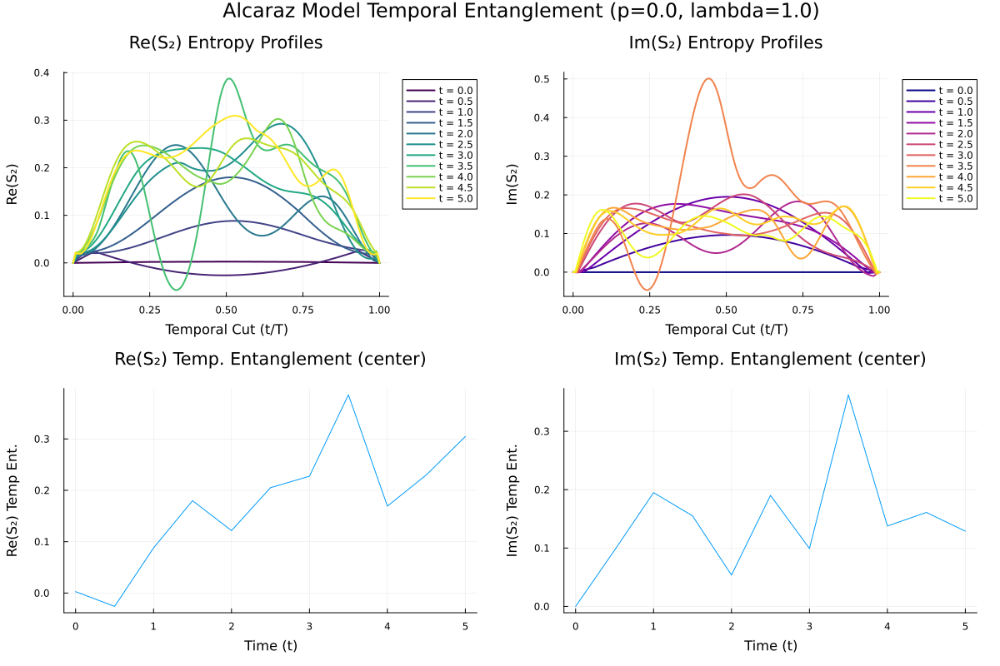

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.002726386516329204, -0.025999104419573683, 0.08784447994159647, 0.1798118178575179, 0.12156573593512945, 0.20510387402546162, 0.22745819871022566, 0.3858917653911298, 0.16917380948911143, 0.23011238738516324, 0.3047160242013952], [-0.0, 0.09640114513398482, 0.19496848861551716, 0.1550720565116812, 0.053667813328554054, 0.19020194671754795, 0.0992351561756496, 0.3625253626722225, 0.13776545163806192, 0.16101582603197725, 0.12887874738759128])

In [22]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_2nd_opt
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.02, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   6%  ETA: 0:03:39 (46.48 ms/it)
   Info: [287]  chi=5 | ds=0.00016796025121923464 | <R|Rprev> = -1.1591767031023155e-5┌ Warning: PM Stuck after 201/289 steps | ds=0.00018182003720190743 | chi=5)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:00:34


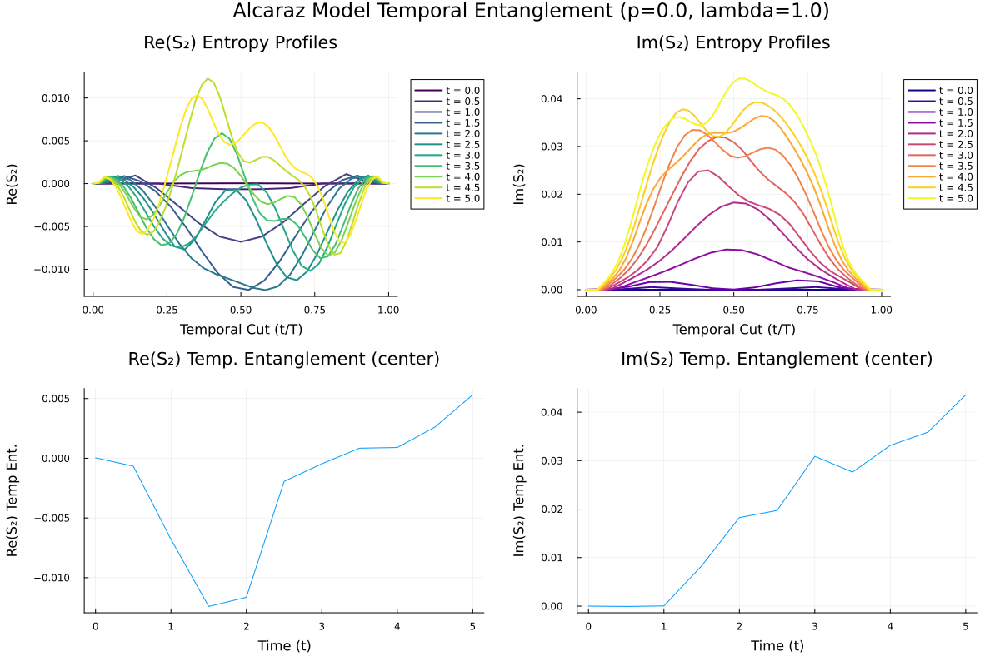

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [3.6689254476928944e-5, -0.0006617875720729472, -0.006791343985300275, -0.01240910624221667, -0.011636311178558961, -0.0019348721174910783, -0.0004617594280980313, 0.0008456067645648577, 0.0008982263608681257, 0.0026132134564809885, 0.005312843854371599], [-0.0, -7.105014191913797e-5, 3.8256704372897365e-5, 0.008302261066892778, 0.018264268664745165, 0.019728540059613657, 0.030889645236177078, 0.027639727265540072, 0.03315404386410915, 0.03589695516564439, 0.043581631596287855])

In [13]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_2nd_opt
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   6%  ETA: 0:06:55 (88.41 ms/it)
   Info: [305]  chi=5 | ds=0.0007590692458945246 | <R|Rprev> = -3.412819419731287e-5┌ Warning: PM Stuck after 201/307 steps | ds=0.0008212017121868032 | chi=5)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:01:21


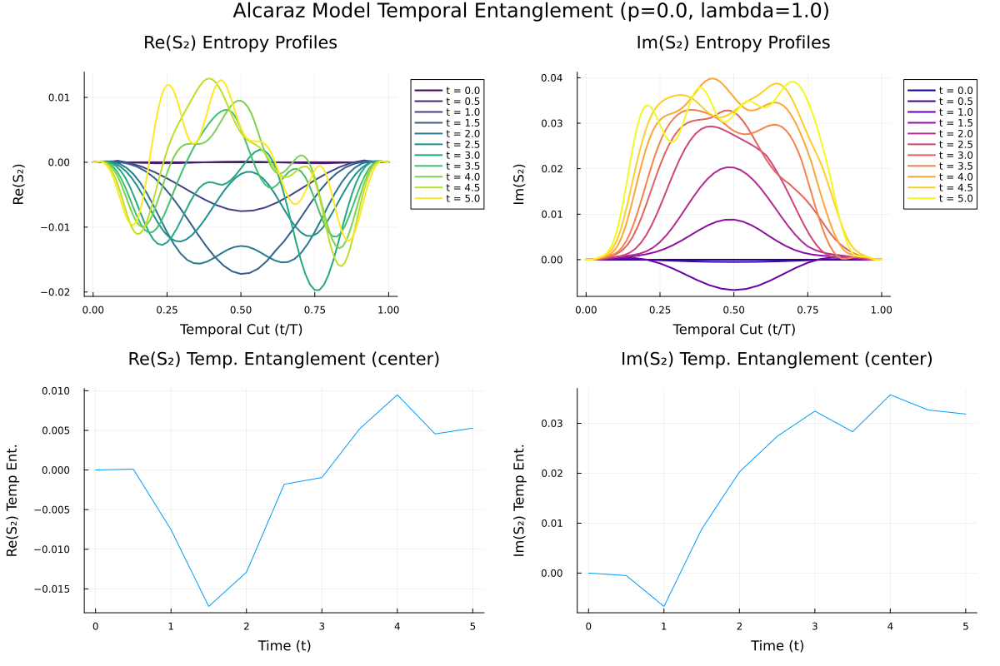

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [1.3355800598136877e-6, 0.00010719814094534642, -0.007538828482467401, -0.017211434488956772, -0.012899554332346283, -0.0018007927876484045, -0.0009495718592726457, 0.005184507118263157, 0.009485154429165045, 0.004553588317802041, 0.005282148438307575], [-0.0, -0.0005071833733524114, -0.0066812557155329555, 0.008807233352518963, 0.02025704897939247, 0.027383156803610732, 0.03244354344372066, 0.02830458004030388, 0.035710714740947044, 0.03267523287462781, 0.03185151360226217])

In [12]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_2nd_opt
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   7%  ETA: 0:04:43 (61.27 ms/it)
   Info: [374]  chi=6 | ds=0.0004270256521159421 | <R|Rprev> = -2.5665574193136982e-5┌ Warning: PM Stuck after 201/375 steps | ds=0.00044257694636173905 | chi=6)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:01:02


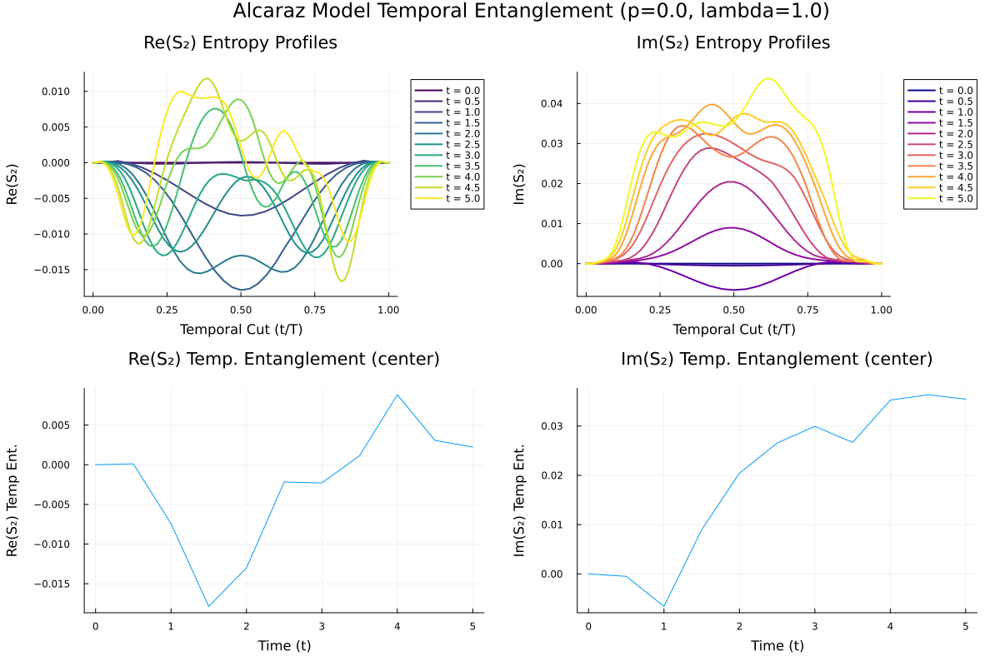

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [1.2364558138693043e-6, 0.00011038846462777588, -0.0074283790963029575, -0.01786119799136921, -0.01300320744034344, -0.002179871806774017, -0.0022888875351367356, 0.0011465243021888882, 0.008817737608047682, 0.003065528125138801, 0.0022290580132453648], [-0.0, -0.0005006213109812813, -0.006598485861464009, 0.00897808598912445, 0.020427578782142665, 0.02655256788565976, 0.029942289753685656, 0.026663940450091645, 0.03526777215587859, 0.036335894988407495, 0.035457906954232794])

In [13]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_1st_opt
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   4%  ETA: 0:07:55 (98.75 ms/it)
   Info: [187]  chi=10 | ds=2.180233703019674e-6 | <R|Rprev> = -5.994008708180095e-13[ Info: PM Converged after 189 steps | ds=9.126007776139033e-7 | chi=10)
Progress: 100%|█████████████████████████████████████████| Time: 0:00:56


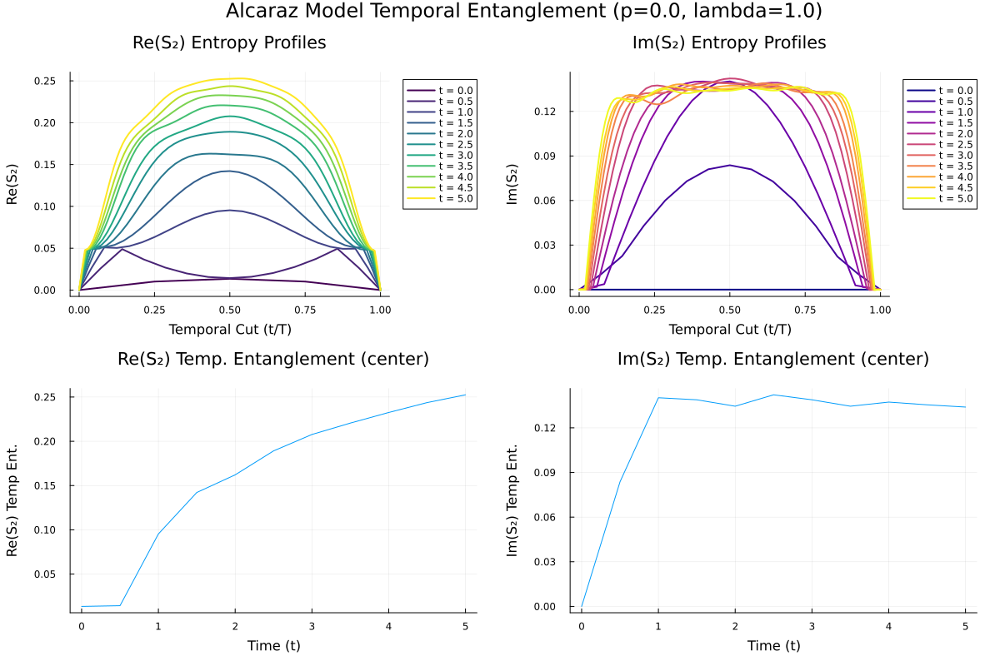

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.013485458989446216, 0.01428575519031157, 0.09535191645156949, 0.1421842278994204, 0.1621039813988966, 0.18915565757742822, 0.20771155114007145, 0.22057149034221207, 0.23254925163841672, 0.24371394347990707, 0.25249766600903945], [1.9028336012156842e-18, 0.08376040659867648, 0.14022692844393086, 0.13884558342530293, 0.13452638800653824, 0.1421982223917173, 0.13884754366018576, 0.13453193729747798, 0.13730262670587287, 0.13546824303211188, 0.13396262924894822])

In [20]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_WII
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times;
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=204, cutoff=1.0e-12, maxdim=250, normalize=overlap)  22%  ETA: 0:15:06 ( 0.23  s/it)
   Info: [1078]  chi=10 | ds=0.0009614546805306601 | <R|Rprev> = -7.1791070436178375e-6┌ Warning: PM Stuck after 201/1079 steps | ds=0.0008234951194798779 | chi=10)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:17:42


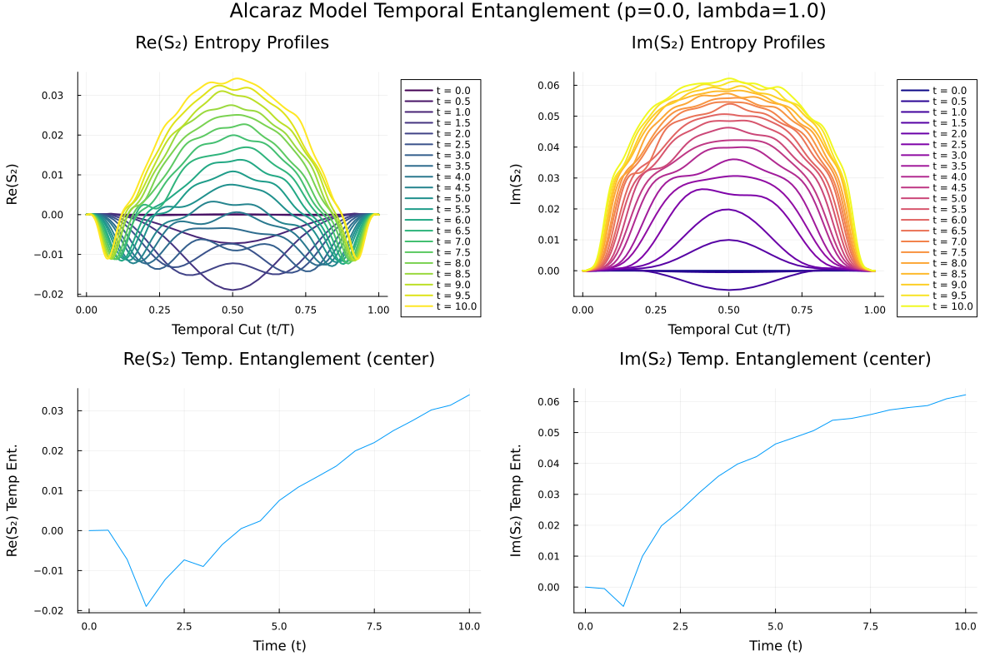

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5  …  5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, 10.0], [1.3395469532709527e-6, 0.00010335633905898298, -0.007219104317492077, -0.018965224138973134, -0.012227022205753182, -0.0073233248141129845, -0.008980707010493874, -0.003495202257931594, 0.0005231832408528925, 0.002424831231275683  …  0.010871370524903152, 0.013479026739756777, 0.016154971749253608, 0.0199674655747918, 0.022030791156151794, 0.025010575355054042, 0.02750216465364111, 0.030200465892141076, 0.031369579192334344, 0.03397975302786221], [1.0325588659532668e-22, -0.0004999958742035519, -0.006258065821994402, 0.009967939489787709, 0.019826050324402014, 0.024808792020546352, 0.03057877981217268, 0.035877138041348816, 0.039805395687535314, 0.042206605142992855  …  0.048414520262435645, 0.05060555024616051, 0.05397442050505353, 0.054573089462242416, 0.05582085873147599, 0.057312357914386824, 0.05809755609473205, 0.05872573255039601, 0.06093657223332618, 0.0622097823068285])

In [15]:
target_times = collect(0.0 : 0.5 : 10.0)

mpo_generator = expH_alcaraz_WII
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250,
)

---

In [15]:
"""
Builds the Alcaraz MPO using the automated OpSum-to-MPO Euler builder.
Uses Algorithm("WII") exactly as specified in the package examples.
"""
function expH_alcaraz_euler(sites::Vector{<:Index}, lambda::Number, p::Number; dt::Number, alg_name::String="WII")
    N = length(sites)
    os = OpSum()

    # 1. Nearest-Neighbor terms
    for j in 1:(N - 1)
        os += -1.0, "Z", j, "Z", j + 1
        os += -p * lambda, "X", j, "X", j + 1
    end

    # 2. Next-Nearest-Neighbor terms
    for j in 1:(N - 2)
        os += -p, "Z", j, "Z", j + 2
    end

    # 3. On-site Transverse Field
    for j in 1:N
        os += -lambda, "X", j
    end

    # Time step conversion for exp(-i * H * dt)
    tau = -im * dt 
    
    # Call the expmpo function using the safe Algorithm("WII") syntax
    return expmpo(os, sites, tau; alg=Algorithm(alg_name))
end

expH_alcaraz_euler

In [8]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_euler
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250,
)

LoadError: UndefVarError: `expH_alcaraz_euler` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

[PM LR|naiveRTM|nosym] L=1004, cutoff=1.0e-12, maxdim=250, normalize=overlap)  12%  ETA: 0:53:48 ( 0.73  s/it)
   Info: [577]  chi=5 | ds=0.000295454808182348 | <R|Rprev> = -7.037248834481704e-8┌ Warning: PM Stuck after 201/578 steps | ds=0.00029535816603534076 | chi=6)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:16:24


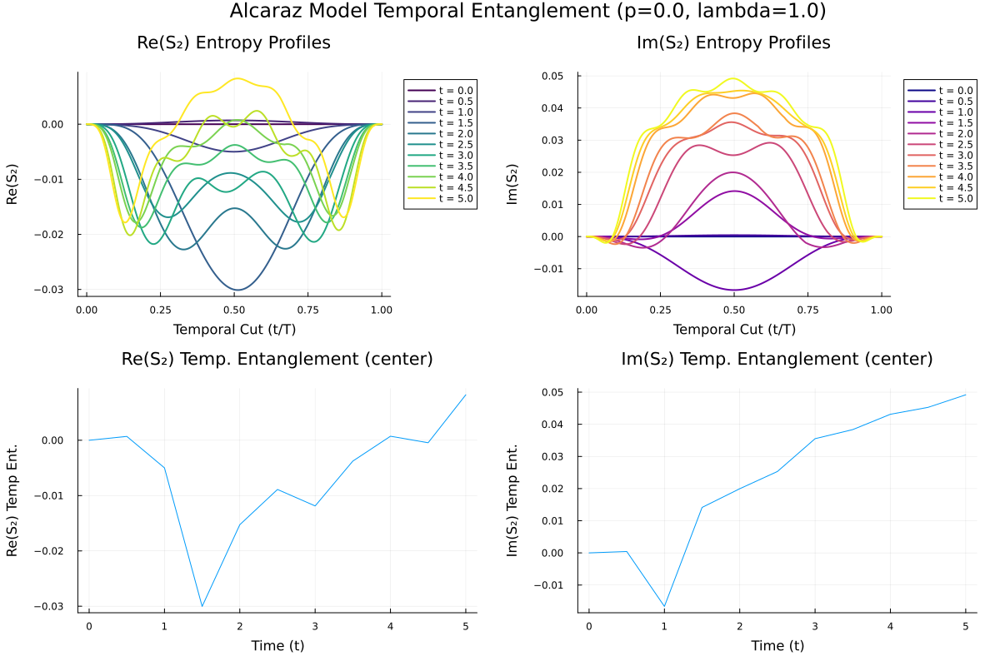

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [2.2204460492503136e-16, 0.0006966525426423657, -0.004995572179715163, -0.030035047938957133, -0.015261806169692322, -0.008896086734141885, -0.011872807864894154, -0.0037669721866706854, 0.0007285940830329633, -0.0004498696891405145, 0.008215825871788767], [-0.0, 0.0004307255267690181, -0.01664596388695088, 0.014146648188877646, 0.01996089265563614, 0.02531823343911517, 0.0355245827950518, 0.03835191412400301, 0.04311937471089719, 0.04527081532830024, 0.04916912827021742])

In [18]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_euler
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.005, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   5%  ETA: 0:06:24 (80.68 ms/it)
   Info: [235]  chi=9 | ds=0.0002361103935892457 | <R|Rprev> = -2.3608375944214096e-6┌ Warning: PM Stuck after 201/236 steps | ds=0.0002955390868312202 | chi=9)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:01:36


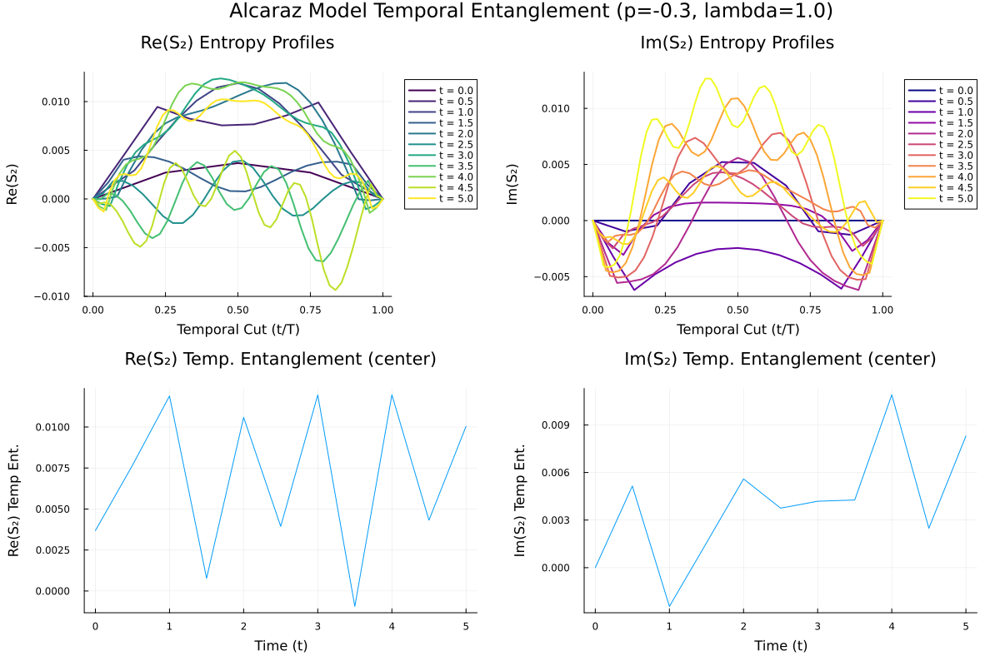

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.0036843366386095787, 0.0076647690295731635, 0.011893367965157428, 0.0007763982586620569, 0.01059051225710657, 0.0039429565511258586, 0.011955448341582723, -0.0009396357242777301, 0.011964661894606926, 0.004317145297502159, 0.010037818349438222], [-0.0, 0.0051467531319705825, -0.0024432664920047923, 0.001563925807731448, 0.005593924925247583, 0.003752285396885156, 0.004188780299741348, 0.004266587127368975, 0.01089946193661848, 0.0024844294057925894, 0.008300498767060691])

In [4]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_2nd_opt
p_val = -0.3

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250,
)

[PM LR|naiveRTM|nosym] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)  17%  ETA: 0:04:15 (61.29 ms/it)
   Info: [841]  chi=7 | ds=7.285278368240888e-5 | <R|Rprev> = -4.720363756036848e-6┌ Warning: PM Stuck after 201/844 steps | ds=0.00013903639488210134 | chi=7)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:02:22


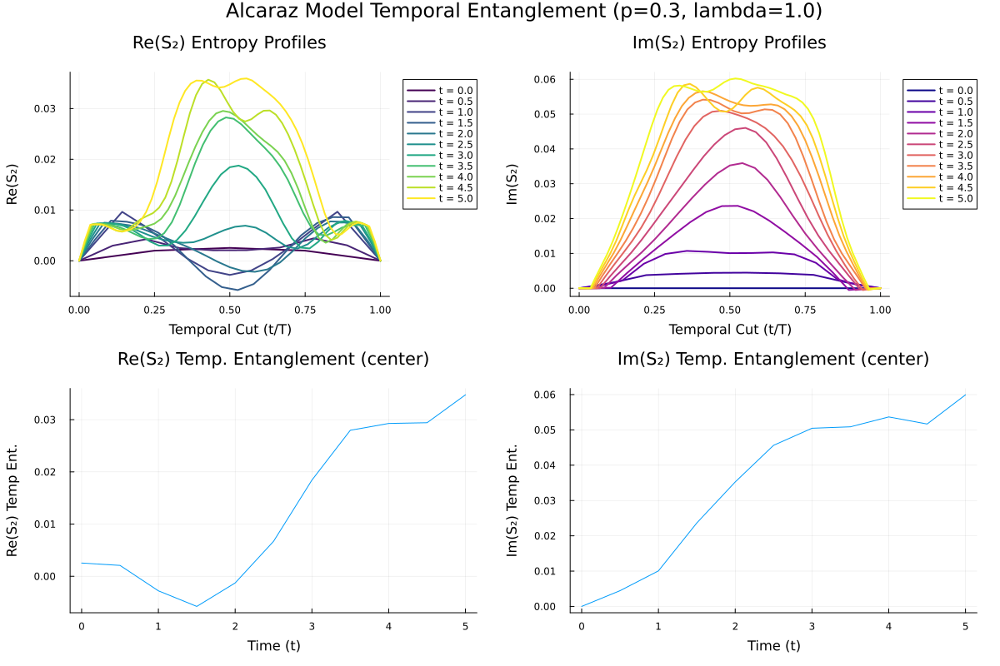

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.0025358286579909278, 0.0020809826456931226, -0.002790900593090465, -0.005774995464978911, -0.0012776385535858922, 0.0066942593825829915, 0.018429246522177922, 0.027970945999291594, 0.029275501198999913, 0.029415310756635223, 0.03476289163959338], [-0.0, 0.004463015229784975, 0.010064065688934882, 0.023647508212769047, 0.03525518717864727, 0.04564066485981917, 0.05046663296907727, 0.05087507706880391, 0.05367508850167234, 0.0516683976267598, 0.059939947499237554])

In [5]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_2nd_opt
p_val = 0.3

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250,
)

[PM LR|densitymatrix|nosym] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   2%  ETA: 2:02:02 ( 1.49  s/it)
   Info: [84]  chi=26 | ds=3.653508546697104e-6 | <R|Rprev> = -2.453238928873597e-10[ Info: PM Converged after 85 steps | ds=9.046719378182425e-7 | chi=26)
Progress: 100%|█████████████████████████████████████████| Time: 0:05:29


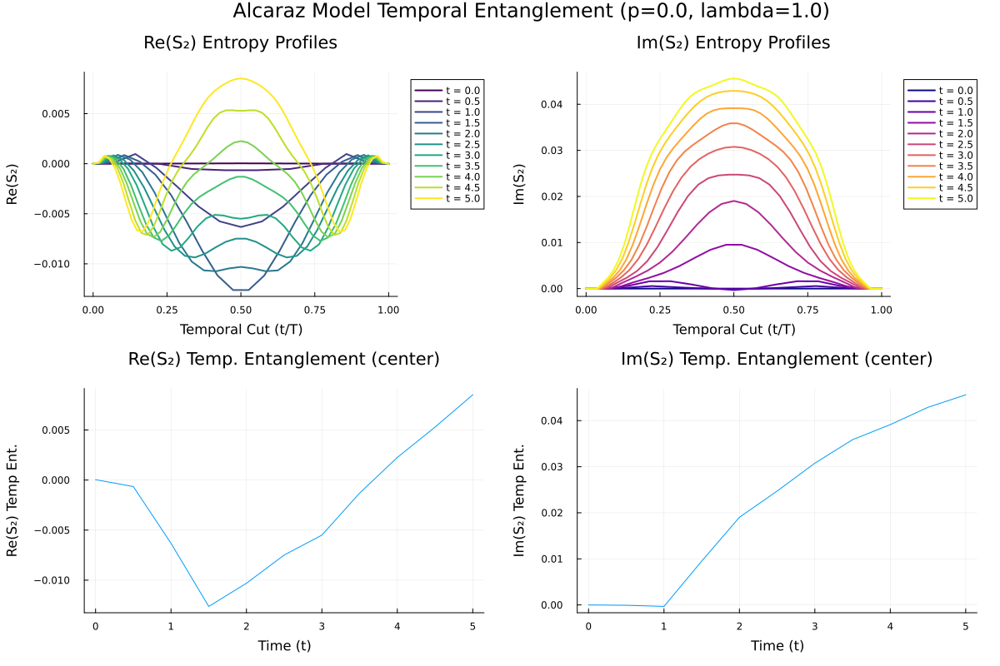

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [3.67085455222036e-5, -0.0006486413775654925, -0.006319951212887368, -0.012619187197068678, -0.010305098750376947, -0.0074861758271903694, -0.005496923991345617, -0.0013059645158803748, 0.0022598462947036654, 0.005289573522890266, 0.008514568919388425], [-0.0, -7.878995148279302e-5, -0.0003198230936244705, 0.009511802771038804, 0.019026689689191755, 0.02471932043066804, 0.03076710034998393, 0.03587033283120722, 0.03913492224172621, 0.04289660747689234, 0.045603204644047296])

In [6]:
target_times = collect(0.0 : 0.5 : 5.0)

mpo_generator = expH_alcaraz_2nd_opt
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250, alg="densitymatrix"
)

[PM LR|densitymatrix|nosym] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   6%  ETA: 17:57:30 (13.76  s/it)
   Info: [301]  chi=47 | ds=2.3535178204081575e-6 | <R|Rprev> = -2.697822819842398e-10[ Info: PM Converged after 302 steps | ds=9.383308390426004e-7 | chi=46)
Progress: 100%|█████████████████████████████████████████| Time: 3:44:05


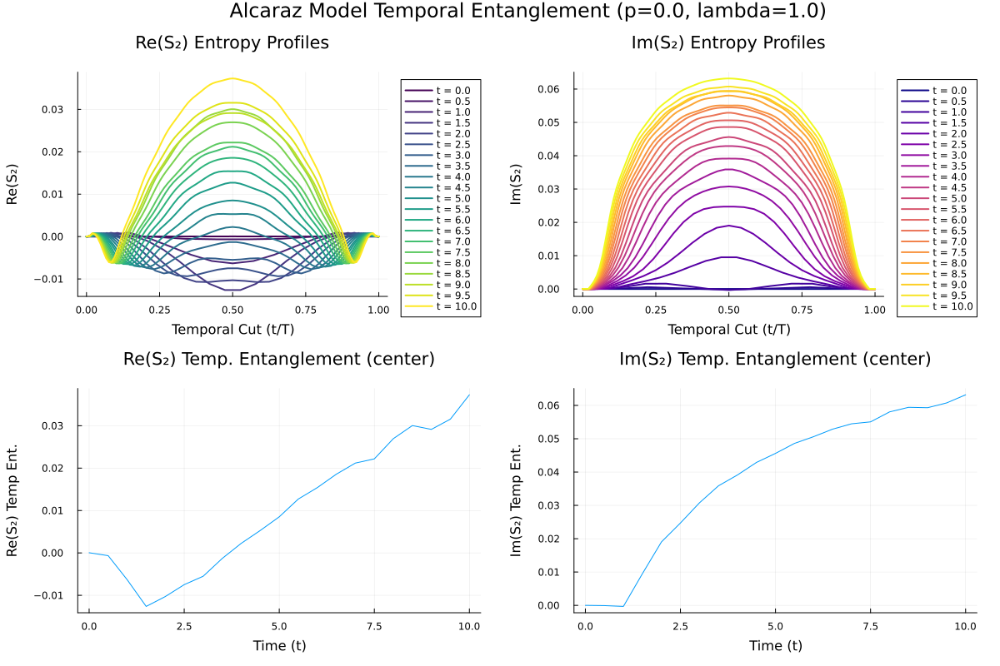

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5  …  5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, 10.0], [3.67085455222036e-5, -0.0006486413775654925, -0.006319951212887368, -0.012619187197068678, -0.010305098750376947, -0.0074861758271903694, -0.005496923991345617, -0.0013059645158803748, 0.0022598462947036654, 0.005289573522890266  …  0.012701522330698897, 0.015397088589064436, 0.01856024251706199, 0.021184374327410726, 0.02217845040459767, 0.02694760765555425, 0.03002873392122613, 0.029130852841005903, 0.03155003365464779, 0.03728659673805277], [-0.0, -7.878995148279302e-5, -0.0003198230936244705, 0.009511802771038804, 0.019026689689191755, 0.02471932043066804, 0.03076710034998393, 0.03587033283120722, 0.03913492224172621, 0.04289660747689234  …  0.048608392465924764, 0.05061549471118697, 0.05287474873079016, 0.054480911206455464, 0.05506119157008374, 0.05805485073170055, 0.05942865503558508, 0.05930899674270499, 0.06074632175991475, 0.06318122945376618])

In [9]:
target_times = collect(0.0 : 0.5 : 10.0)

mpo_generator = expH_alcaraz_2nd_opt
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250, alg="densitymatrix"
)